# Build neighbourhood VDJ feature space

In [27]:
import numpy as np
import seaborn as sns
import os
import pandas as pd
import scanpy as sc
import dandelion as ddl
ddl.logging.print_header()

dandelion==0.3.1.dev21 pandas==1.4.4 numpy==1.19.4 matplotlib==3.5.2 networkx==2.8.8 scipy==1.5.3


In [28]:
import matplotlib.pyplot as plt

In [29]:
# set working directory
os.chdir('/lustre/scratch117/cellgen/team205/cs42/VDJ_collab_manuscript/')

In [30]:
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [31]:
# figure directory
fig_path = '/home/jovyan/mount/gdrive/VDJ_collab/plots_output/chenqu_jhub/'
sc.settings.figdir = fig_path

# Load data

In [6]:
meta_ab = pd.read_csv('metadata/abTCR_metadata_cleaned_24032022.csv')

In [41]:
# object loaded with abTCR, gdTCR, BCR data in 02_panfetal_load_VDJ
#adata = sc.read('write/PAN.A01.v01.entire_data_normalised_log.20210429.LYMPHOID.embedding_dandelion_110123.h5ad')
adata = sc.read('write/abTCR_110123_panfetal.h5ad')
adata

AnnData object with n_obs × n_vars = 241950 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'anno_lvl_2_final_clean', 'has_contig', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VD

# Filter cells

In [15]:
# only take samples that had TCR sequencing done, and exclude CD137, MAIT sort
adata_abtcr = adata[adata.obs['file'].isin(meta_ab['GEX_id'])].copy()
adata_abtcr = adata_abtcr[~(adata_abtcr.obs['Sort_id'].isin(['CD137','MAIT']))]

### Subset cells to DP onwards, and cells with paired TCRab

In [8]:
# set up subsets and colors
ct_order = ['DP(P)_T','DP(Q)_T','ABT(ENTRY)','CD8+T','CD4+T']
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette('colorblind'))[range(len(ct_order))]))

In [17]:
adata_abtcr

View of AnnData object with n_obs × n_vars = 106281 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'anno_lvl_2_final_clean', 'has_contig', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j

In [140]:
# utility function to setup the data to only contain cells with VDJ info.
bdata = ddl.tl.setup_vdj_pseudobulk(adata_abtcr, 
                                    subsetby='anno_lvl_2_final_clean', 
                                    groups = ct_order,
                                    mode = 'abT')
bdata

AnnData object with n_obs × n_vars = 17248 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'anno_lvl_2_final_clean', 'has_contig', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ

# Select neighbourhoods 

In [19]:
## need to redo neighborhood graph after subsetting cells before milo
# n_neighbors decides the minimum neighbourhood size 
# here use_rep = 'X_scvi' as data integration was done using scVI
sc.pp.neighbors(bdata, use_rep = "X_scvi", n_neighbors = 50)
sc.tl.umap(bdata, random_state = 1712)

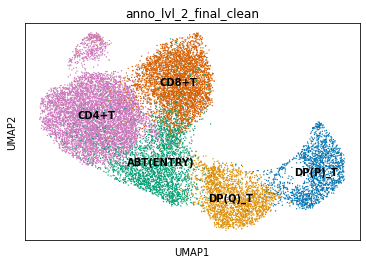

In [9]:
# take a look at the UMAP to make sure it looks reasonable i.e. different cell types are clustered separately
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = [5.5,5]
sc.pl.umap(bdata, color=['anno_lvl_2_final_clean'], palette = ct_color_map, legend_loc = 'on data', legend_fontsize=10, save='dp_cell_umap.pdf')

In [21]:
import milopy
import milopy.core as milo

# use milo to sample neighbourhood
milo.make_nhoods(bdata)
# build neighbourhood adata in bdata.uns['nhood_adata']
milo.count_nhoods(bdata, sample_col='file') # this step is needed to build bdata.uns['nhood_adata'] and sample_col can be anything
# this step is needed for plotting below
milopy.utils.build_nhood_graph(bdata)
# assign neighbourhood celltype by majority voting
# results are in bdata.uns['nhood_adata'].obs['nhood_annotation'] & bdata.uns['nhood_adata'].obs['nhood_annotation_frac'] 
milopy.utils.annotate_nhoods(bdata, anno_col='anno_lvl_2_final_clean')
bdata

/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.


AnnData object with n_obs × n_vars = 17248 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'anno_lvl_2_final_clean', 'has_contig', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ

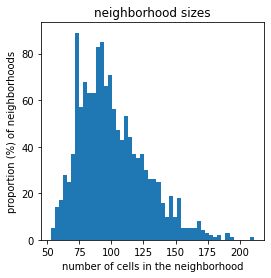

In [22]:
# histogram to look at neighbourhood sizes ### optional
plt.rcParams["figure.figsize"] = [4,4]
plt.hist(np.array(bdata.obsm["nhoods"].sum(0)).flatten(), bins=50);
plt.title('neighborhood sizes')
plt.xlabel('number of cells in the neighborhood')
plt.ylabel('proportion (%) of neighborhoods')
plt.savefig(fig_path+'TCR_neighbourhood_size.pdf')

Now neighbourhood adata is stored in bdata.uns['nhood_adata']

In [23]:
bdata.uns['nhood_adata']

AnnData object with n_obs × n_vars = 1348 × 53
    obs: 'index_cell', 'kth_distance', 'Nhood_size', 'nhood_annotation', 'nhood_annotation_frac'
    uns: 'sample_col', 'nhood', 'annotation_labels', 'annotation_obs'
    obsm: 'X_milo_graph', 'frac_annotation'
    obsp: 'nhood_connectivities'

### Plotting neighbourhood graph on same UMAP (**optional - not needed for downstream analysis)

In [24]:
# remove edges if the min no of shared cells btw nhoods are less than min_overlap, this is to reduce the number of edges on plot
import scipy as sp
from scipy.sparse import csr_matrix

min_overlap = 30
nhood_conn = bdata.uns['nhood_adata'].obsp['nhood_connectivities'].todense()
nhood_conn[nhood_conn < min_overlap] = 0
bdata.uns['nhood_adata'].obsp['nhood_connectivities'] = sp.sparse.csr_matrix(nhood_conn)

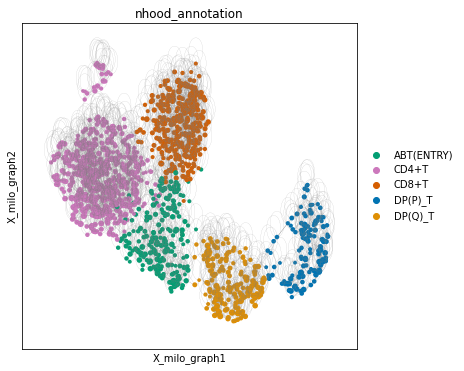

In [25]:
# plot nhood on UMAP, but legend does not include line thickness and node size
plt.rcParams["figure.figsize"] = [6,6]
sc.pl.embedding(bdata.uns['nhood_adata'], basis='X_milo_graph', sizes=list(bdata.uns['nhood_adata'].obs['Nhood_size']),
                color='nhood_annotation',palette=ct_color_map,edges=True, 
                neighbors_key='nhood')

In [26]:
# plot the above in R to include the full legend
# save the following object and follow nhood_plot.R
pd.DataFrame(nhood_conn).to_csv('csv/nhood_conn.csv')
pd.DataFrame(bdata.uns['nhood_adata'].obsm['X_milo_graph']).to_csv('csv/layout.csv')
bdata.uns['nhood_adata'].obs.to_csv('csv/nhood_obs.csv')

In [27]:
# somehow this is needed before writing bdata
bdata.uns['nhood_adata'].uns['annotation_labels'] = np.nan
bdata.write('write/DP_subset_bdata.h5ad')

In [6]:
bdata = sc.read('write/DP_subset_bdata.h5ad')

# Create neighbourhood VDJ feature space

In [29]:
# function for making neighbourhood vdj feature space
nhood_adata = ddl.tl.vdj_pseudobulk(bdata, pbs = bdata.obsm['nhoods'], obs_to_take = 'anno_lvl_2_final_clean', 
                                    extract_cols=['v_call_abT_VDJ_main', 'j_call_abT_VDJ_main','v_call_abT_VJ_main','j_call_abT_VJ_main'])
nhood_adata

/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.


AnnData object with n_obs × n_vars = 1348 × 160
    obs: 'anno_lvl_2_final_clean', 'anno_lvl_2_final_clean_fraction', 'cell_count'
    obsm: 'pbs'

     nhood_adata is the new neighbourhood VDJ feature space, whereby each observation is a cell neighbourhood
     VDJ usage frequency stored in nhood_adata.X
     VDJ genes stored in nhood_adata.var
     neighbourhood metadata stored in nhood_adata.obs
     can visualise the data using PCA or UMAP (see below)

In [30]:
# # sort out the annotation colour order
nhood_adata.obs['anno_lvl_2_final_clean'] = nhood_adata.obs['anno_lvl_2_final_clean'].astype('category')
nhood_adata.obs['anno_lvl_2_final_clean'] = nhood_adata.obs['anno_lvl_2_final_clean'].cat.reorder_categories(ct_order)

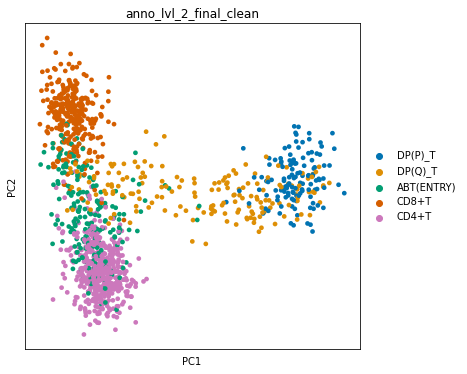

In [31]:
sc.pp.pca(nhood_adata, random_state = 1712)
sc.pl.pca(nhood_adata, color=['anno_lvl_2_final_clean'], palette=ct_color_map)

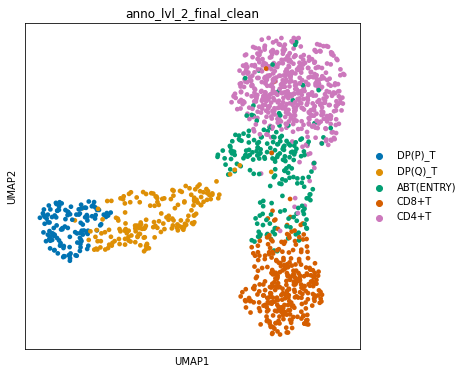

In [32]:
sc.pp.neighbors(nhood_adata, random_state = 1712)
sc.tl.umap(nhood_adata, random_state = 1712)
sc.pl.umap(nhood_adata, color=['anno_lvl_2_final_clean'], palette=ct_color_map)

In [33]:
### optional (only for plotting)
# save first 2 PCs for plotting in 01_nhood_plot.R
pd.DataFrame(nhood_adata.obsm['X_pca'][:,[0,1]]).to_csv('csv/layout_vdj_pca.csv')
pd.DataFrame(nhood_adata.obsm['X_umap'][:,[0,1]]).to_csv('csv/layout_vdj_umap.csv')

### Run Pseudotime on VDJ feature space

In [34]:
# make sure you install palantir if you don't already have it
# pip install palantir
import palantir
# Run diffusion maps
pca_projections = pd.DataFrame(nhood_adata.obsm['X_pca'], index=nhood_adata.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections, n_components=5)
ms_data = palantir.utils.determine_multiscale_space(dm_res)

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


Determing nearest neighbor graph...


In [35]:
#### need to add this line to restore plotting function of scanpy in the presence of palantir
%matplotlib inline

In [37]:
# select the start and end points
# start
tmp = nhood_adata[nhood_adata.obs['anno_lvl_2_final_clean'] == 'DP(P)_T']
rootcell = np.argmin(tmp.obsm['X_umap'][:,0])
rootcell = tmp.obs_names[rootcell]
nhood_adata.obs['rootcell'] = 0
nhood_adata.obs.loc[rootcell,'rootcell'] = 1

In [38]:
# ends
tmp1 = nhood_adata[nhood_adata.obs['anno_lvl_2_final_clean'] == 'CD8+T']
tmp2 = nhood_adata[nhood_adata.obs['anno_lvl_2_final_clean'] == 'CD4+T']
endcell1 = np.argmin(tmp1.obsm['X_umap'][:,1])
endcell1 = tmp1.obs_names[endcell1]
endcell2 = np.argmax(tmp2.obsm['X_umap'][:,1])
endcell2 = tmp2.obs_names[endcell2]

terminal_states = pd.Series(['CD8+T', 'CD4+T'], 
                           index=[endcell1,endcell2])

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


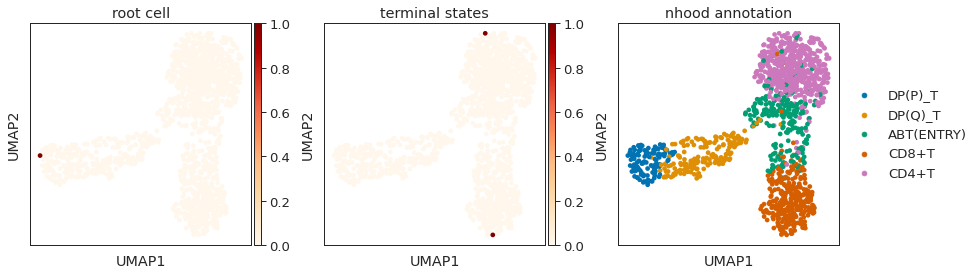

In [39]:
# plot rootcell and terminal states
nhood_adata.obs['terminal_states'] = 0
nhood_adata.obs.loc[terminal_states.index, 'terminal_states'] = 1
plt.rcParams["figure.figsize"] = [4,4]
sc.pl.umap(nhood_adata,color=['rootcell','terminal_states','anno_lvl_2_final_clean'],
           title=['root cell','terminal states','nhood annotation'],color_map='OrRd',save='dp_rootcell_term.pdf')

In [40]:
pr_res = palantir.core.run_palantir(ms_data,  rootcell, num_waypoints=500, 
                                    terminal_states = terminal_states.index)

Sampling and flocking waypoints...
Time for determining waypoints: 0.0017042994499206544 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.08967324097951253 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/palantir/core.py:447: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/palantir/core.py:450: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


In [41]:
pr_res.branch_probs.columns = terminal_states[pr_res.branch_probs.columns]

## Visualise the data

In [42]:
ddl.tl.pseudotime_transfer(adata = nhood_adata, pr_res = pr_res, suffix = '_nhood_vdj')

AnnData object with n_obs × n_vars = 1348 × 160
    obs: 'anno_lvl_2_final_clean', 'anno_lvl_2_final_clean_fraction', 'cell_count', 'rootcell', 'terminal_states', 'pseudotime_nhood_vdj', 'prob_CD8+T_nhood_vdj', 'prob_CD4+T_nhood_vdj'
    uns: 'pca', 'anno_lvl_2_final_clean_colors', 'neighbors', 'umap'
    obsm: 'pbs', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

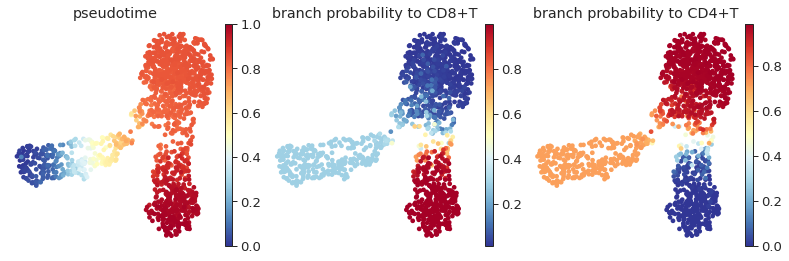

In [43]:
plt.rcParams["figure.figsize"] = [4,4]
plot = ['pseudotime', 'prob_CD8+T', 'prob_CD4+T']
sc.pl.umap(nhood_adata,color=[term + '_nhood_vdj' for term in plot],
           title=['pseudotime','branch probability to CD8+T',
                  'branch probability to CD4+T'],
           frameon=False,wspace=0.1,
           color_map = 'RdYlBu_r',save='dp_tcr_pseudotime.pdf'
          )

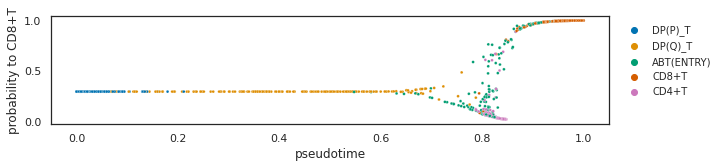

In [44]:
sns.set_theme(style='white')
fig, ax = plt.subplots(figsize=(10,2))

ax= sns.scatterplot(data=nhood_adata.obs, 
                    x ='pseudotime_nhood_vdj',
                    y='prob_CD8+T_nhood_vdj',
                    s=8,
                    hue='anno_lvl_2_final_clean',
                    palette = ct_color_map)
ax.set_ylabel('probability to CD8+T')    
ax.set_xlabel('pseudotime')
ax.set_title('')
h,l = ax.get_legend_handles_labels()
l1 = ax.legend(h[:5],l[:5], loc='upper right',bbox_to_anchor=(1.2, 1),frameon=False, fontsize='small')
plt.savefig(fig_path+'pseudotime_scatterplot_nhood_vdj.pdf',bbox_inches='tight')

In [45]:
#nhood_adata.write('write/DP_nhood_adata_pseudotime_vdj.h5ad')
nhood_adata.write('write/DP_nhood_adata_pseudotime_vdj_11012023.h5ad')

In [6]:
nhood_adata = sc.read('write/DP_nhood_adata_pseudotime_vdj_11012023.h5ad')

### look at VDJ usage along pseudotime

In [47]:
genes = nhood_adata.var_names
imp_df = pd.DataFrame(nhood_adata[:, genes].X,
                     index=nhood_adata.obs_names, columns=genes)
gene_trends = palantir.presults.compute_gene_trends( pr_res, imp_df.loc[:, genes]) # palantir takes 500 bins, and expression weighted by fate probabilites

CD8+T
Time for processing CD8+T: 0.1823924938837687 minutes
CD4+T
Time for processing CD4+T: 0.10229012171427408 minutes


In [50]:
# take out TRAV/TRAJ gene trends over CD8+T pseudotime
chain = 'TRAV'
df = gene_trends['CD8+T']['trends']
df = df.loc[df.index.str.startswith(chain),:]
df = df.loc[~(np.sum(df, axis=1)==0),:] # remove rows with all 0s

# only leave top 10 used genes for plotting
top_10 = (np.max(df,axis=1)).sort_values(ascending=False)[0:10].index
df = df.loc[top_10,:]

# sort by time of peaked expression
df_order = [0]*df.shape[0]
for i in range(df.shape[0]):
    df_order[i] = np.argmax(df.iloc[i,:])
df_sorted = df.iloc[np.argsort(df_order),:]

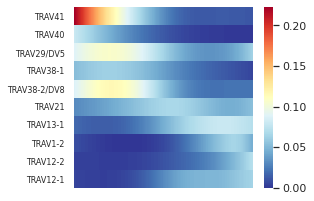

In [51]:
uniform_data = df_sorted
uniform_data=uniform_data.astype('float')
fig, ax = plt.subplots(figsize=(4,uniform_data.shape[0]/3))
ax = sns.heatmap(uniform_data,cmap='RdYlBu_r', xticklabels=False)
_, ylabels = plt.yticks()
ax.set_yticklabels(ylabels, size=8)

plt.savefig(fig_path+'cd8_pseudotime_'+chain+'.pdf',bbox_inches='tight');

## Project pseudotime and branch probabilities back to cells

In [52]:
# project the nhood level pseudotime to cell level pseudotime.
cdata = ddl.tl.project_pseudotime_to_cell(adata = bdata, 
                               pb_adata = nhood_adata, 
                               term_states=['CD8+T','CD4+T'], 
                               suffix = '_nhood_vdj')

number of cells removed due to not belonging to any neighbourhood 91


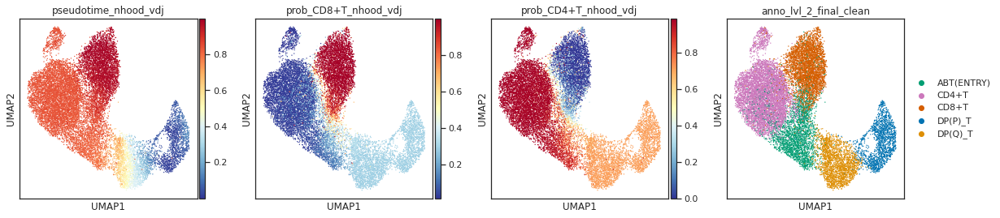

In [53]:
sc.pl.umap(cdata, 
           color=[term + '_nhood_vdj' for term in plot]+['anno_lvl_2_final_clean'],
           color_map = 'RdYlBu_r')

so here, compare to pseudotime computed with gene expression

# Option 1. Compare to pseudotime computed with single cell gene expression 

In [54]:
# Run diffusion maps
pca_projections = pd.DataFrame(cdata.obsm['X_scvi'], index=cdata.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections, n_components=20)

Determing nearest neighbor graph...


In [55]:
ms_data = palantir.utils.determine_multiscale_space(dm_res)

In [56]:
# choose the highest UMAP2 DP(P)_T as root cell
umap2 = cdata.obsm['X_umap'][:,1]
cdata.obs['rootcell']=0
dp_select = list(cdata.obs['anno_lvl_2_final_clean']=='DP(P)_T')
dp = pd.DataFrame(index = cdata.obs_names[dp_select],data=umap2[dp_select])
cdata.obs.loc[dp.index[np.argsort(dp[0])][dp.shape[0]-2], 'rootcell']=1

In [65]:
cd8_select = list(cdata.obs['anno_lvl_2_final_clean']=='CD8+T')
cd4_select = list(cdata.obs['anno_lvl_2_final_clean']=='CD4+T')
#cd8 = pd.DataFrame(index = cdata.obs_names[cd8_select],data=umap2[cd8_select])
#cd4 = pd.DataFrame(index = cdata.obs_names[cd4_select],data=umap2[cd4_select])
umap1 = cdata.obsm['X_umap'][:,0]
umap2 = cdata.obsm['X_umap'][:,1]
cd8 = pd.DataFrame(index = cdata.obs_names[cd8_select],data=umap2[cd8_select])
cd4 = pd.DataFrame(index = cdata.obs_names[cd4_select],data=umap1[cd4_select])

# choose the 2 ends on UMAP2 for CD4+T and CD8+T as terminal states
tmp = [cd8.index[np.argmax(cd8[0])],cd4.index[np.argmin(cd4[0])]]
terminal_states_cell = pd.Series(['CD8+T', 'CD4+T'], 
                           index=tmp)

cdata.obs['terminal_states']=0
cdata.obs.loc[terminal_states_cell.index, 'terminal_states']=1

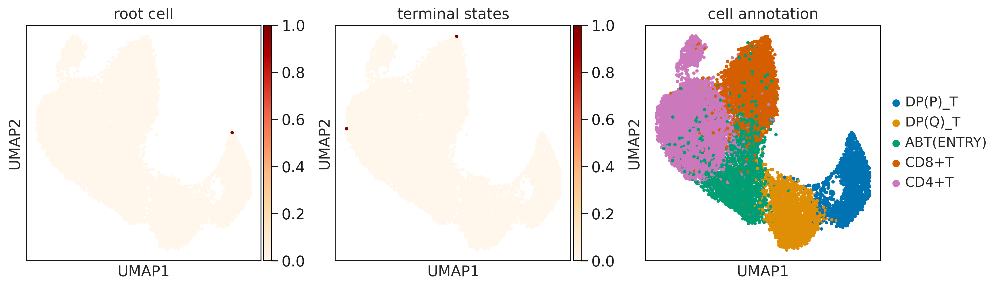

In [66]:
plt.rcParams["figure.figsize"] = [4,4]
sc.pl.umap(cdata, color=['rootcell','terminal_states','anno_lvl_2_final_clean'],
           title=['root cell','terminal states','cell annotation'],wspace=0.2,
           color_map='OrRd',size=40,palette = ct_color_map,save='single_cell_palantir_rootcell.pdf'
          )

In [67]:
pr_res = palantir.core.run_palantir(ms_data, list(cdata.obs_names[cdata.obs['rootcell']==1]), num_waypoints=500, 
                                    terminal_states = terminal_states_cell.index)

Sampling and flocking waypoints...
Time for determining waypoints: 0.026826663812001546 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.21194552580515544 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/palantir/core.py:447: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/palantir/core.py:450: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


In [68]:
pr_res.branch_probs.columns = terminal_states_cell[pr_res.branch_probs.columns]

In [69]:
ddl.tl.pseudotime_transfer(adata = cdata, pr_res = pr_res, suffix = '_cell_gex')

AnnData object with n_obs × n_vars = 17157 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'uniform_label', 'uniform_label_expanded_merged', 'uniform_label_lvl0', 'organ', 'Sample.lanes', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Processing_method', 'AnnatomicalPart', 'Sample', 'bbk', 'scvi_clusters', 'anno_lvl_2_LYMPHOID', 'anno_lvl_2_MYELOID', 'anno_lvl_2_MEM_PROGENITORS', 'leiden_150', 'anno_lvl_2_final_clean', 'has_contig', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', 'v_call_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ

In [70]:
sc.settings.set_figure_params(dpi = 160, color_map = 'RdYlBu_r', dpi_save = 300, format = 'pdf')
plt.rcParams["figure.figsize"] = [4,4]
sns.set_palette('colorblind')

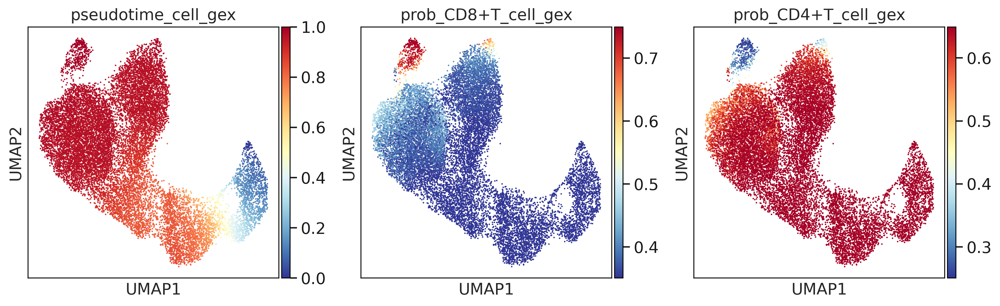

In [71]:
sc.pl.umap(cdata,color=[term + '_cell_gex' for term in plot], save = 'dp_single_cell_palantir.pdf')

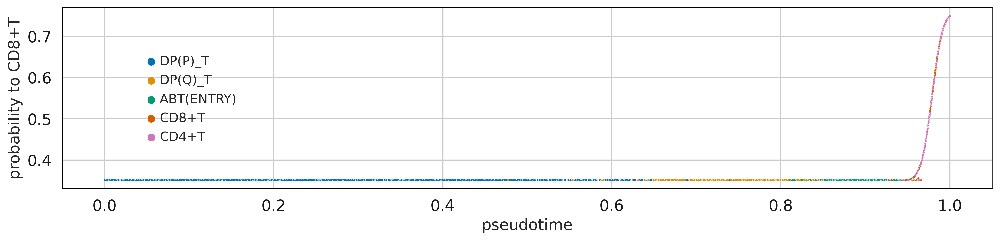

In [72]:
fig, ax = plt.subplots(figsize=(15,3))
#plt.subplots_adjust(hspace=0.6)

# order celltypes for legend
cdata.obs['anno_lvl_2_final_clean'] = cdata.obs['anno_lvl_2_final_clean'].cat.reorder_categories(ct_order)

ax= sns.scatterplot(data=cdata.obs, x ='pseudotime_cell_gex',y='prob_CD8+T_cell_gex',s=4,hue='anno_lvl_2_final_clean',palette = ct_color_map)
ax.set_ylabel('probability to CD8+T')    
ax.set_xlabel('pseudotime')
ax.set_title('')
h,l = ax.get_legend_handles_labels()
l1 = ax.legend(h[:5],l[:5], loc='upper right',bbox_to_anchor=(0.2, 0.8),frameon=False, fontsize='small')
plt.savefig(fig_path+'pseudotime_scatterplot_cell_gex.pdf',bbox_inches='tight')

# Option 2. Compare pseudotime using GEX on neighbourhoods

In [73]:
### Pseudobulk gene expression by neighbourhoods 

In [74]:
adata_count = sc.read('/nfs/team205/ed6/data/Fetal_immune/PAN.A01.v01.entire_data_raw_count.20210429.NKT.h5ad')

Only considering the two last: ['.NKT', '.h5ad'].
Only considering the two last: ['.NKT', '.h5ad'].


/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [75]:
cdata_raw = adata_count[cdata.obs_names].copy()

In [76]:
cdata_raw.obs['anno_lvl_2_final_clean'] = cdata.obs.loc[cdata_raw.obs_names, 'anno_lvl_2_final_clean']

In [77]:
nhood_adata_gex = ddl.tl.pseudobulk_gex(adata_raw = cdata_raw, pbs = cdata.obsm['nhoods'], obs_to_take = 'anno_lvl_2_final_clean')
nhood_adata_gex

/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 1348 × 33538
    obs: 'anno_lvl_2_final_clean', 'anno_lvl_2_final_clean_fraction', 'cell_count'
    var: 'GeneID', 'GeneName'
    obsm: 'pbs'

In [78]:
# perform normalization and log transformation
sc.pp.normalize_per_cell(nhood_adata_gex,counts_per_cell_after=10e4)
sc.pp.log1p(nhood_adata_gex)

/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [79]:
sc.pp.highly_variable_genes(nhood_adata_gex)

In [80]:
sc.tl.pca(nhood_adata_gex, svd_solver='arpack', random_state = 1712)

In [81]:
sc.pp.neighbors(nhood_adata_gex, n_neighbors = 50)

In [82]:
sc.tl.umap(nhood_adata_gex, random_state = 1712)

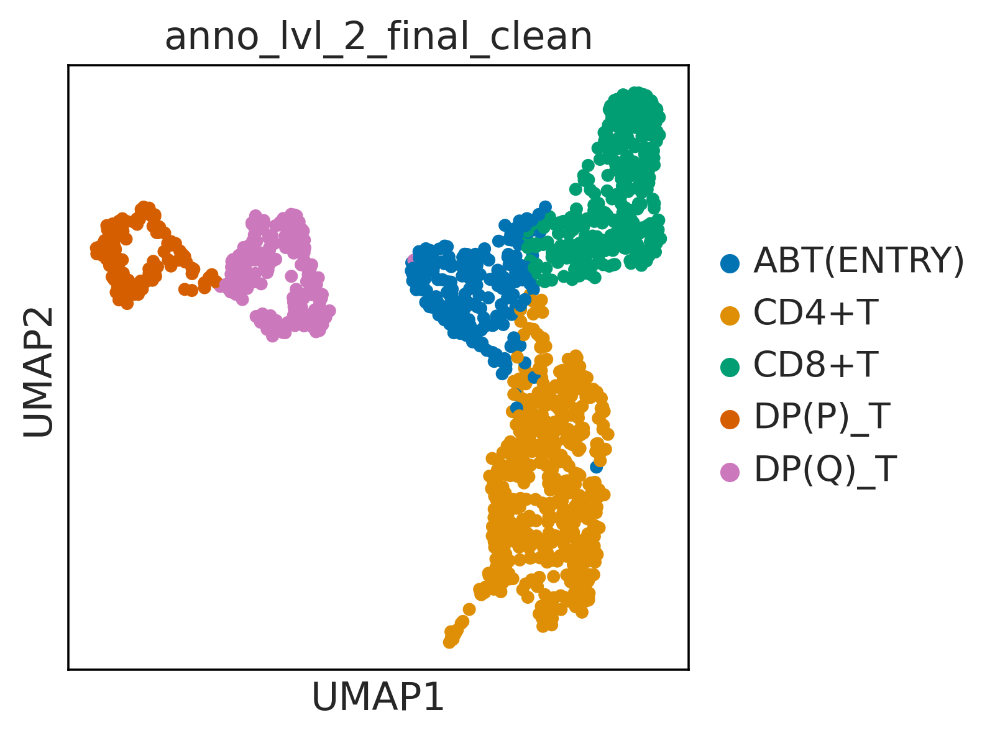

In [83]:
sc.pl.umap(nhood_adata_gex,color=['anno_lvl_2_final_clean']
#            , save='pseudobulk_umap.pdf'
          )

In [84]:
# Run diffusion maps
pca_projections = pd.DataFrame(nhood_adata_gex.obsm['X_pca'], index=nhood_adata_gex.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections, n_components=5)

Determing nearest neighbor graph...


In [85]:
ms_data = palantir.utils.determine_multiscale_space(dm_res)

In [86]:
rootcell = np.argmin(nhood_adata_gex.obsm['X_umap'][:,0])
nhood_adata_gex.obs['rootcell'] = 0
nhood_adata_gex.obs.loc[rootcell.astype('str'),'rootcell'] = 1

In [87]:
umap2 = nhood_adata_gex.obsm['X_umap'][:,1]
cd8_select = list(nhood_adata_gex.obs['anno_lvl_2_final_clean']=='CD8+T')
cd8 = pd.DataFrame(index = nhood_adata_gex.obs_names[cd8_select],data=umap2[cd8_select])

terminal_states = pd.Series(['CD8+T', 'CD4+T'], index=[cd8.index[np.argmax(cd8[0])]] + [nhood_adata_gex.obs_names[np.argmin(umap2)]])

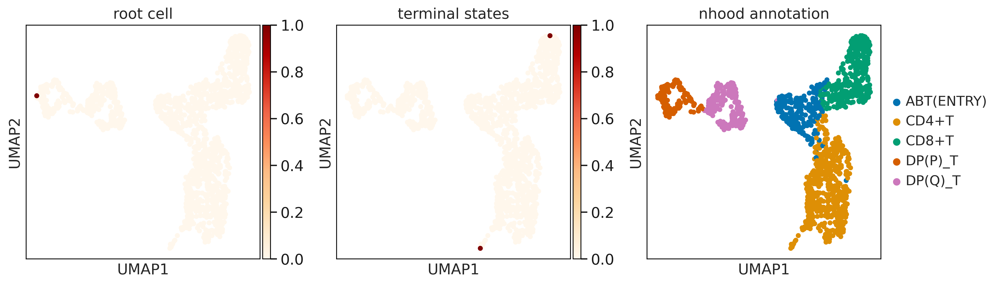

In [88]:
# plot rootcell and terminal states
nhood_adata_gex.obs['terminal_states'] = 0
nhood_adata_gex.obs.loc[terminal_states.index, 'terminal_states'] = 1
plt.rcParams["figure.figsize"] = [4,4]
sc.pl.umap(nhood_adata_gex,color=['rootcell','terminal_states','anno_lvl_2_final_clean'],color_map='OrRd',
           title=['root cell','terminal states','nhood annotation'],
           save='dp_rootcell_term_gex.pdf')

In [89]:
pr_res = palantir.core.run_palantir(ms_data,  nhood_adata_gex.obs_names[rootcell], num_waypoints=500, 
                                    terminal_states = terminal_states.index) # use same rootcell and terminal states as TCR_adata

Sampling and flocking waypoints...
Time for determining waypoints: 0.0013978799184163411 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.01827115217844645 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...


/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:2686: RuntimeWarning: invalid value encountered in true_divide
/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/palantir/core.py:447: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/palantir/core.py:450: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


Project results to all cells...


In [90]:
pr_res.branch_probs.columns = terminal_states[pr_res.branch_probs.columns]

In [91]:
ddl.tl.pseudotime_transfer(adata = nhood_adata_gex, pr_res = pr_res, suffix = '_nhood_gex')

AnnData object with n_obs × n_vars = 1348 × 33538
    obs: 'anno_lvl_2_final_clean', 'anno_lvl_2_final_clean_fraction', 'cell_count', 'n_counts', 'rootcell', 'terminal_states', 'pseudotime_nhood_gex', 'prob_CD4+T_nhood_gex', 'prob_CD8+T_nhood_gex'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'anno_lvl_2_final_clean_colors'
    obsm: 'pbs', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

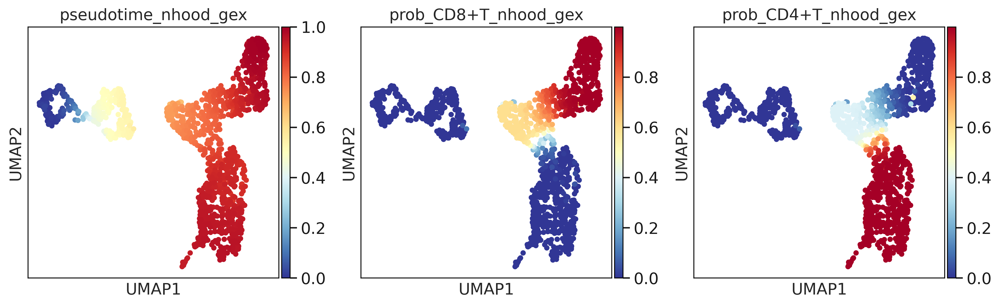

In [92]:
sc.pl.umap(nhood_adata_gex,color=[term + '_nhood_gex' for term in plot],ncols=4,save = 'dp_pseudotime_nhood_gex.pdf'
          )

In [93]:
# transfer pseudotime back to cells
cdata = ddl.tl.project_pseudotime_to_cell(adata = cdata, pb_adata = nhood_adata_gex, term_states=['CD8+T','CD4+T'], suffix = '_nhood_gex')

number of cells removed due to not belonging to any neighbourhood 0


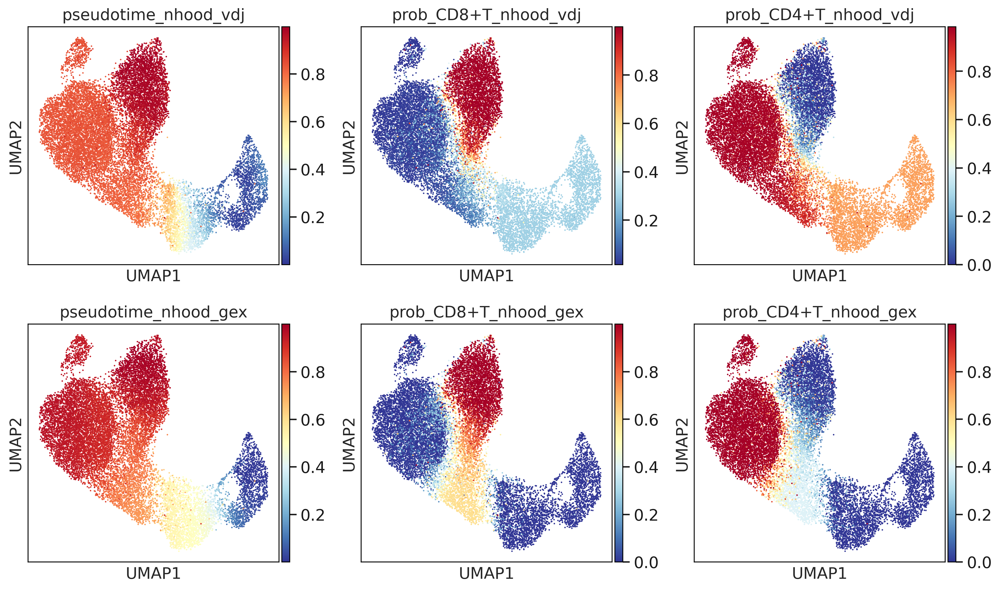

In [94]:
sc.pl.umap(cdata,color= [term + '_nhood_vdj' for term in plot] +[term + '_nhood_gex' for term in plot],
           ncols=3, 
#            save = 'dp_pseudotime_combined.pdf'
          )

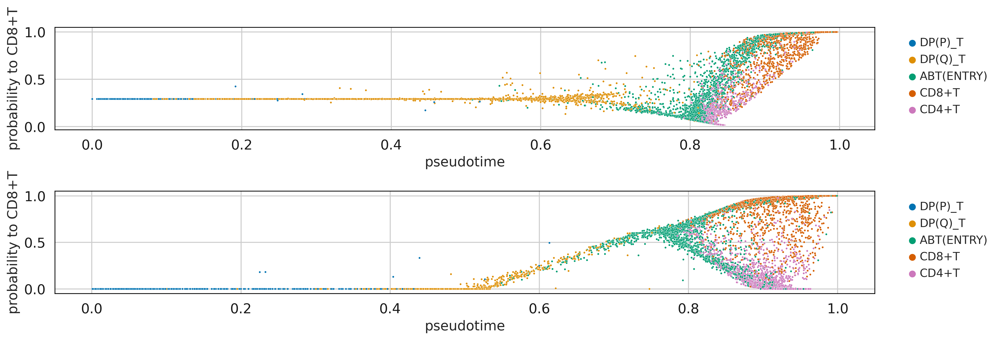

In [95]:
fig, ax = plt.subplots(2,1,figsize=(15,5))
plt.subplots_adjust(hspace=0.6)

# order celltypes for legend
cdata.obs['anno_lvl_2_final_clean'] = cdata.obs['anno_lvl_2_final_clean'].cat.reorder_categories(ct_order)

ax[0]= sns.scatterplot(data=cdata.obs, x ='pseudotime_nhood_vdj',y='prob_CD8+T_nhood_vdj',s=4,ax=ax[0],hue='anno_lvl_2_final_clean',palette = ct_color_map)
ax[0].set_ylabel('probability to CD8+T')    
ax[0].set_xlabel('pseudotime')
ax[0].set_title('')
h,l = ax[0].get_legend_handles_labels()
l1 = ax[0].legend(h[:5],l[:5], loc='upper right',bbox_to_anchor=(1.15, 1),frameon=False, fontsize='small')

ax[1]=sns.scatterplot(data=cdata.obs, x ='pseudotime_nhood_gex',y='prob_CD8+T_nhood_gex',s=4,ax=ax[1],hue='anno_lvl_2_final_clean',palette = ct_color_map)
ax[1].set_ylabel('probability to CD8+T')    
ax[1].set_xlabel('pseudotime')
ax[1].set_title('')
h,l = ax[1].get_legend_handles_labels()
l1 = ax[1].legend(h[:5],l[:5], loc='upper right',bbox_to_anchor=(1.15, 1),frameon=False, fontsize='small')

# plt.savefig(fig_path+'pseudotime_scatterplot.pdf',bbox_inches='tight')

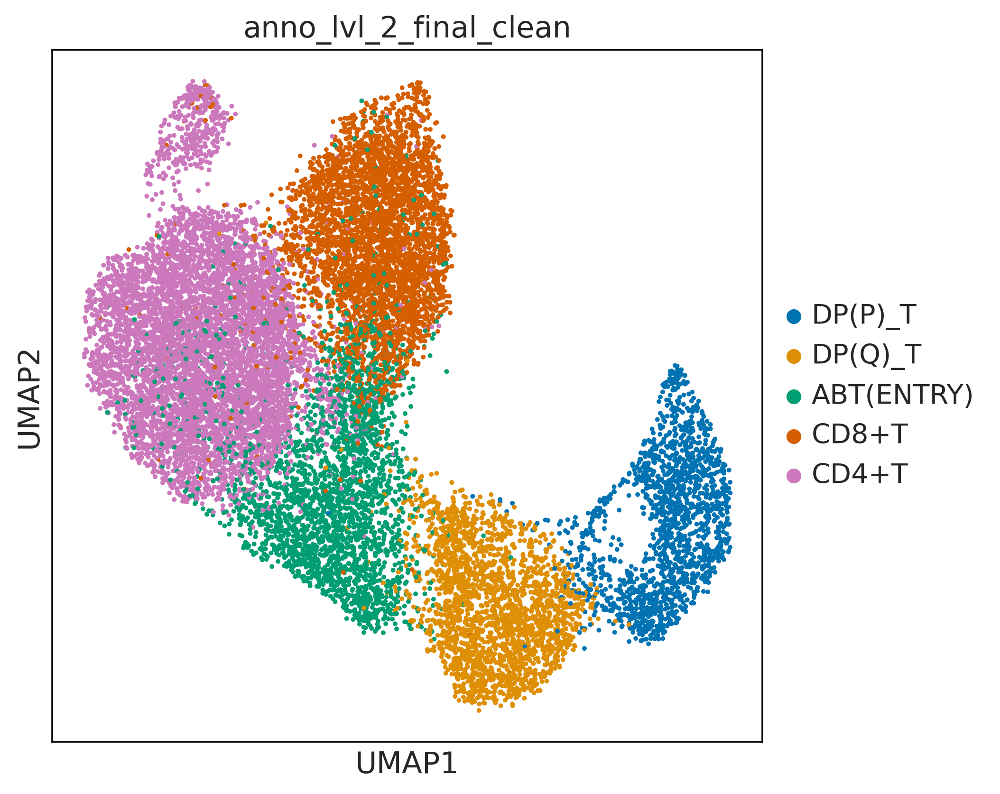

In [96]:
plt.rcParams["figure.figsize"] = [6,6]
sc.pl.umap(cdata,color= ['anno_lvl_2_final_clean'],legend_loc='right margin',palette=ct_color_map,size=20,
           ncols=1, save = 'cell_umap.pdf')

In [98]:
#import matplotlib
#matplotlib.rcParams['pdf.fonttype'] = 42
#matplotlib.rcParams['ps.fonttype'] = 42

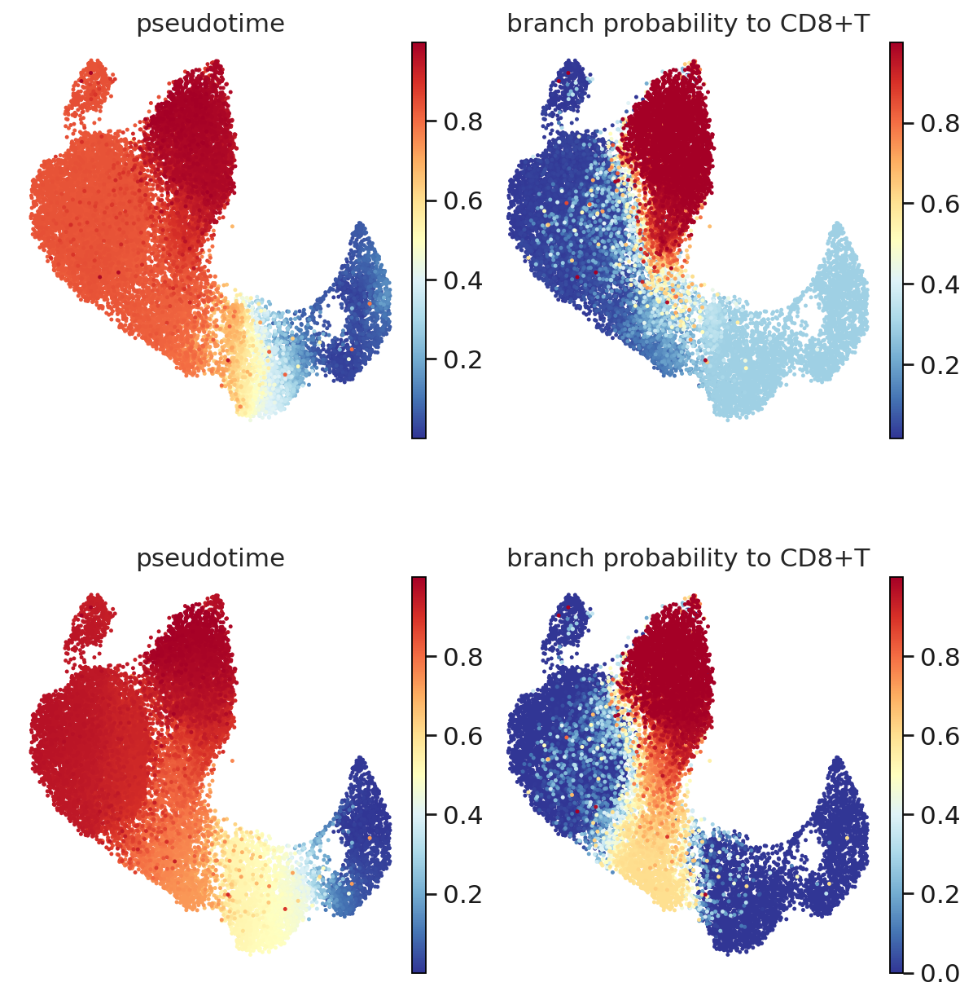

In [99]:
plt.rcParams["figure.figsize"] = [4,4.35]
plot_less = ['pseudotime','prob_CD8+T']
sc.set_figure_params(figsize = [4,4.35], dpi_save = 900, vector_friendly = True)
sc.pl.umap(cdata,color= [term + '_nhood_vdj' for term in plot_less] +[term + '_nhood_gex' for term in plot_less], 
           title=['pseudotime','branch probability to CD8+T','pseudotime','branch probability to CD8+T'],
           hspace=0.35, wspace=0.1,frameon=False, size=20,
           ncols=2, cmap = 'RdYlBu_r',
         save = 'dp_pseudotime_combined_less.pdf'
          )

In [100]:
#nhood_adata_gex.write('write/DP_nhood_adata_pseudotime_gex.h5ad')
nhood_adata_gex.write('write/DP_nhood_adata_pseudotime_gex_11012023.h5ad')
# somehow this is needed to write cdata
#cdata.uns['nhood_adata'].uns['annotation_labels'] = np.nan
#cdata.write('write/DP_cell_adata_pseudotime_with_gex.h5ad')
cdata.uns['nhood_adata'].uns['annotation_labels'] = np.nan
cdata.write('write/DP_cell_adata_pseudotime_with_gex_11012023.h5ad')

In [35]:
cdata = sc.read('write/DP_cell_adata_pseudotime_with_gex_11012023.h5ad')
nhood_adata_gex=sc.read('write/DP_nhood_adata_pseudotime_gex_11012023.h5ad')

/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


# TCR pseudotime gives better DP(Q) ordering

In [11]:
# # load tcr nhood_adata
# nhood_adata = sc.read('write/DP_nhood_adata_pseudotime_05012023.h5ad')

# transfer pseudotime_nhood_gex to nhood_adata
for col in [term + '_nhood_gex' for term in plot]:
    nhood_adata.obs[col] = nhood_adata_gex.obs[col]

In [12]:
# load TCR list by location - lists in github folder metadata/TCR_genes
TCR_list_by_loc_dict = {}
for chain in ['TRAV','TRAJ']:
    path = 'gene_list/'+chain+'_list_by_location.csv'
    TCR_list_by_loc_dict[chain] = list(pd.read_csv(path, header=None)[0])

In [20]:
chain = 'TRAV' # 'TRAV' or 'TRAJ'

In [21]:
# only leave nhoods with at least 90% cells being DP(Q)_T
DP = nhood_adata[np.array(nhood_adata.obs['anno_lvl_2_final_clean']=='DP(Q)_T') & np.array(nhood_adata.obs['anno_lvl_2_final_clean_fraction']>0.9)]
# only look at TRAV/TRAJ
TRAV_TRAJ = pd.DataFrame(data = DP[:,DP.var_names.str.startswith(chain)].X, index = DP.obs_names, columns = DP.var_names[DP.var_names.str.startswith(chain)])

In [22]:
# encode TRAV genomic locations numerically (i.e. from 1 to 46)
gene_loc = pd.DataFrame(index = TRAV_TRAJ.columns, columns = ['location'], dtype='int')
for gene in TRAV_TRAJ.columns:
    gene_loc.loc[gene, 'location'] = TCR_list_by_loc_dict[chain].index(gene)

In [23]:
# calculate average TRAV geenomic location for each neighbourhood
df_plot = pd.DataFrame({'loc':TRAV_TRAJ.dot(gene_loc['location']),
                       't_tcr_order': DP.obs['pseudotime_nhood_vdj'].rank(),
                        't_gex_order':DP.obs['pseudotime_nhood_gex'].rank()})

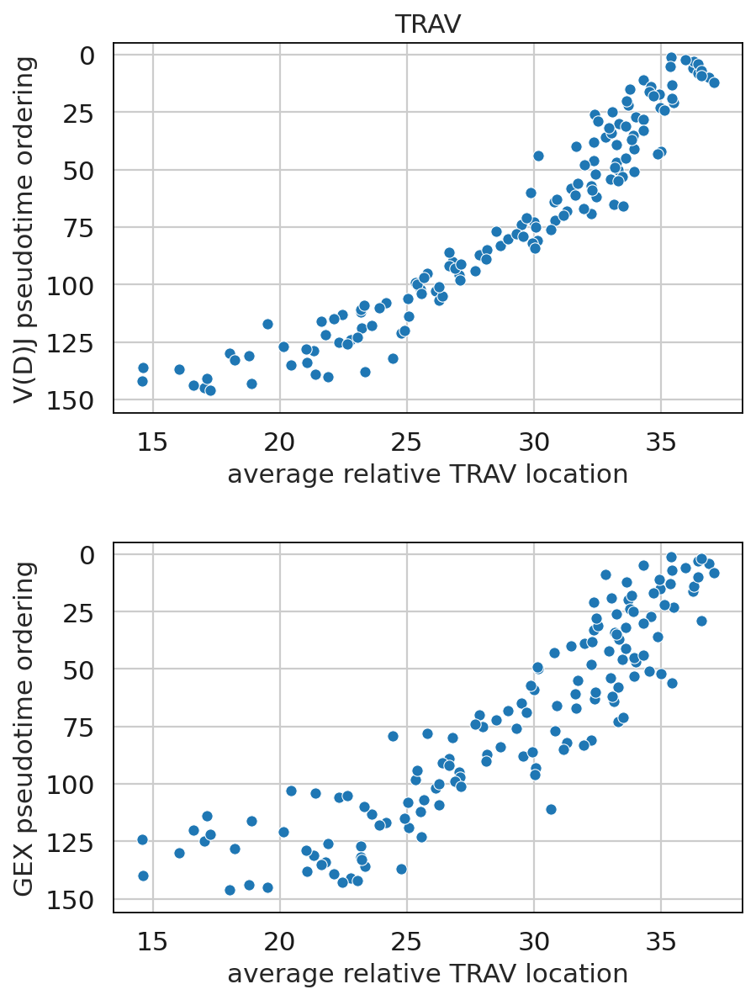

In [117]:
fig, ax = plt.subplots(2,1,figsize=(6,8.5))
plt.subplots_adjust(wspace=0.25,hspace=0.35)

sns.scatterplot(data = df_plot, x = 'loc', y = 't_tcr_order',ax=ax[0]) 
ax[0].set_title(chain)
ax[0].set_ylabel('V(D)J pseudotime ordering')
ax[0].set_xlabel('average relative ' + chain + ' location')
ax[0].set_ylim(df_plot.shape[0]+10,-5)

# for TRAJ - remove y axis ticks and tick labels
#ax[0].set_ylabel('') 
#ax[0].set(yticklabels=[])
#ax[0].tick_params(left=False)

sns.scatterplot(data = df_plot, x = 'loc', y = 't_gex_order',ax=ax[1])
ax[1].set_title('')
ax[1].set_ylabel('GEX pseudotime ordering')
ax[1].set_xlabel('average relative ' + chain + ' location')
ax[1].set_ylim(df_plot.shape[0]+10,-5)

# for TRAJ - remove y axis ticks and tick labels
#ax[1].set_ylabel('') 
#ax[1].set(yticklabels=[])
#ax[1].tick_params(left=False)

plt.savefig(fig_path+chain+'_location_pseudotime.pdf',bbox_inches='tight');

In [24]:
import scipy
# calculate correlation r & pval for every 30 neighbourhoods
df4_tcr = df_plot.sort_values(by='t_tcr_order', ascending=True).copy()
df4_tcr['cor'] = df4_tcr['pval'] = np.nan
bandwidth = 30
for i in range(df_plot.shape[0]-bandwidth):
    y = df4_tcr.iloc[i:i+bandwidth,0]
    x = df4_tcr.iloc[i:i+bandwidth,1]
    df4_tcr.iloc[i+bandwidth//2,3] = scipy.stats.pearsonr(x,y)[0]
    df4_tcr.iloc[i+bandwidth//2,4] = scipy.stats.pearsonr(x,y)[1]
df4_tcr['sig'] = df4_tcr['pval']<0.05

In [25]:
# calculate correlation r & pval for every 31 neighbourhoods
df4_gex = df_plot.sort_values(by='t_gex_order', ascending=True).copy()
df4_gex['cor'] = df4_gex['pval'] = np.nan
bandwidth = 30
for i in range(df_plot.shape[0]-bandwidth):
    y = df4_gex.iloc[i:i+bandwidth,0]
    x = df4_gex.iloc[i:i+bandwidth,2]
    df4_gex.iloc[i+bandwidth//2,3] = scipy.stats.pearsonr(x,y)[0]
    df4_gex.iloc[i+bandwidth//2,4] = scipy.stats.pearsonr(x,y)[1]
df4_gex['sig'] = df4_gex['pval']<0.05

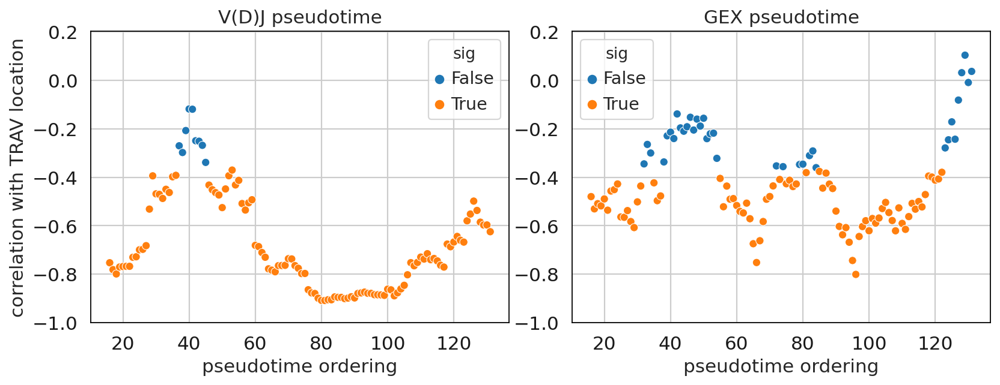

In [120]:
fig, ax = plt.subplots(1,2,figsize=(12,4))
plt.subplots_adjust(wspace=0.15,hspace=0.25)

sns.scatterplot(data = df4_tcr, y = 'cor', x = 't_tcr_order',hue= 'sig',ax=ax[0])
ax[0].set_title('V(D)J pseudotime')
ax[0].set_xlabel('pseudotime ordering')
ax[0].set_ylabel('correlation with ' +chain+ ' location')
ax[0].set_ylim(-1,np.max(df4_gex['cor'])+0.1) # for TRAV
#ax[0].set_ylim(np.min(df4_gex['cor']),1) # for TRAJ

sns.scatterplot(data = df4_gex, y = 'cor', x = 't_gex_order',hue= 'sig',ax=ax[1])
ax[1].set_title('GEX pseudotime')
ax[1].set_xlabel('pseudotime ordering')
ax[1].set_ylabel('')
ax[1].set_ylim(-1,np.max(df4_gex['cor'])+0.1) # for TRAV
#ax[1].set_ylim(np.min(df4_gex['cor']),1) # for TRAJ

plt.savefig(fig_path+chain+'_location_pseudotime_cor.pdf',bbox_inches='tight');

In [26]:
print(chain, np.mean(df4_tcr['cor'][15:df_plot.shape[0]-15]), np.mean(df4_gex['cor'][15:df_plot.shape[0]-15]))

TRAV -0.6703519418763727 -0.4257734430158459


In [19]:
print(chain, np.mean(df4_tcr['cor'][15:df_plot.shape[0]-15]), np.mean(df4_gex['cor'][15:df_plot.shape[0]-15]))

TRAJ 0.5050210467201199 0.422722629883501


# TCR trajectory gives better abT(entry) splitting

Take out abt(entry) cells, look at correlation of gene expressions with prob_CD8

In [122]:
abt = cdata[cdata.obs['anno_lvl_2_final_clean']=='ABT(ENTRY)']
abt.raw = abt

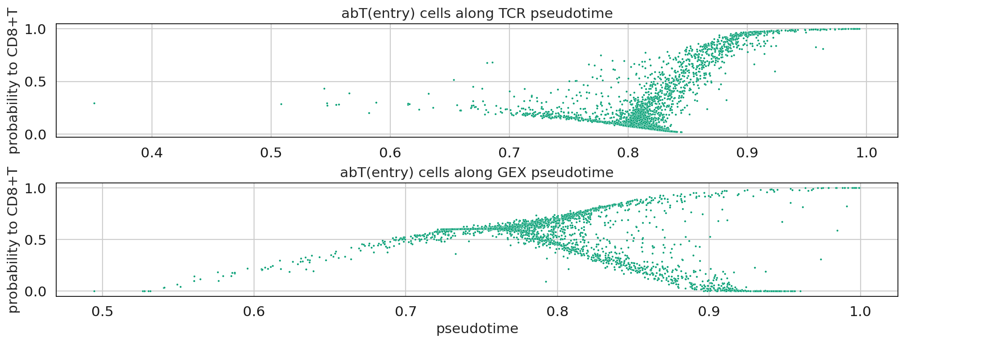

In [123]:
fig, ax = plt.subplots(2,1,figsize=(15,5))
plt.subplots_adjust(hspace=0.4)
ax[0]= sns.scatterplot(data=abt.obs, x ='pseudotime_nhood_vdj',y='prob_CD8+T_nhood_vdj',s=4,ax=ax[0],hue='anno_lvl_2_final_clean',palette = ct_color_map)
ax[0].set_ylabel('probability to CD8+T')    
ax[0].set_xlabel('')
ax[0].set_title('abT(entry) cells along TCR pseudotime')
h,l = ax[0].get_legend_handles_labels()
l1 = ax[0].legend('','', loc='upper right',bbox_to_anchor=(1.12, 1),frameon=False, fontsize='small')

ax[1]=sns.scatterplot(data=abt.obs, x ='pseudotime_nhood_gex',y='prob_CD8+T_nhood_gex',s=4,ax=ax[1],hue='anno_lvl_2_final_clean',palette = ct_color_map)
ax[1].set_ylabel('probability to CD8+T')    
ax[1].set_xlabel('pseudotime')
ax[1].set_title('abT(entry) cells along GEX pseudotime')
h,l = ax[1].get_legend_handles_labels()
l1 = ax[1].legend('','', loc='upper right',bbox_to_anchor=(1.12, 1),frameon=False, fontsize='small')

plt.savefig(fig_path+'abtentry_pseudotime.pdf',bbox_inches='tight')

In [124]:
gene_exp = np.array(abt.raw.X.todense())
cor_result = pd.DataFrame(index = abt.raw.var_names, columns = ['cor_tcr','pval_tcr','adjp_tcr','cor_gex','pval_gex','adjp_gex'])

In [125]:
for i in range(cor_result.shape[0]):
    gene = cor_result.index[i]
    x = gene_exp[:,i]
    y_tcr = abt.obs['prob_CD8+T_nhood_vdj']
    y_gex = abt.obs['prob_CD8+T_nhood_gex']
    
    # calculate pearson correlation 
    cor_result.loc[gene, 'cor_tcr']=scipy.stats.pearsonr(x,y_tcr)[0]
    cor_result.loc[gene, 'pval_tcr']=scipy.stats.pearsonr(x,y_tcr)[1]
    
    cor_result.loc[gene, 'cor_gex']=scipy.stats.pearsonr(x,y_gex)[0]
    cor_result.loc[gene, 'pval_gex']=scipy.stats.pearsonr(x,y_gex)[1]

/home/jovyan/my-conda-envs/palantir/lib/python3.8/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.


In [126]:
cor_result = cor_result.loc[~(cor_result['cor_tcr'].isna()),:]
import statsmodels.stats.multitest as smm
_,cor_result['adjp_tcr']=smm.fdrcorrection(cor_result['pval_tcr'])
_,cor_result['adjp_gex']=smm.fdrcorrection(cor_result['pval_gex'])
cor_result.to_csv('~/mount/gdrive/VDJ_collab/manuscript/supplement/abtentry_cor_result.csv')

In [127]:
cor_result = pd.read_csv('~/mount/gdrive/VDJ_collab/manuscript/supplement/abtentry_cor_result.csv', index_col=0)

stripplot plot of correlation in 03_correlation_striplot.R

In [128]:
# genes sorted by cor_tcr
df = cor_result.loc[cor_result['adjp_tcr']<0.05,:]
df.sort_values(by=['cor_tcr'],ascending=False)

,cor_tcr,pval_tcr,adjp_tcr,cor_gex,pval_gex,adjp_gex
CD8B,0.570448,4.405586e-239,7.862649e-235,0.309147,1.850329e-62,1.100761e-58
CD8A,0.417259,3.162724e-117,1.881505e-113,0.312472,7.694494e-64,6.866182e-60
LINC02446,0.402594,1.618485e-108,7.221276e-105,0.262481,6.635614e-45,1.691797e-41
FTL,0.352599,5.980805e-82,1.524849e-78,0.254428,3.297452e-42,7.356204e-39
NACA,0.332825,1.096822e-72,1.957499e-69,0.113066,2.381682e-09,1.923343e-07
...,...,...,...,...,...,...
S100A11,-0.343269,1.702963e-77,3.376976e-74,-0.236747,1.284011e-36,1.636839e-33
CD40LG,-0.351977,1.198124e-81,2.672864e-78,-0.269293,2.923895e-47,8.697125e-44
HPGD,-0.367147,3.337816e-89,9.928334e-86,-0.150449,1.680706e-15,3.029855e-13
ACTB,-0.396452,5.352940e-105,1.910678e-101,-0.018858,3.209407e-01,6.841650e-01


In [129]:
TF = pd.read_csv('/home/jovyan/gene_list/human_TF_list.csv', header=1)
TF_list = list(TF['Name'][TF['Unnamed: 3']=='Yes'])

In [130]:
#df = cor_result.loc[cor_result['adjp_tcr']<0.05,:]
df = cor_result.copy()
df = df.loc[df.index.isin(TF_list),:]
df = df.sort_values(by=['cor_tcr'],ascending=False)
df.to_csv('csv/abtentry_cor_result_tf.csv')

In [131]:
df

,cor_tcr,pval_tcr,adjp_tcr,cor_gex,pval_gex,adjp_gex
ZNF496,0.135829,6.897402e-13,5.806506e-11,0.098542,2.008605e-07,1.160116e-05
MBNL2,0.123379,7.132747e-11,4.803703e-09,0.038206,4.428586e-02,2.446965e-01
RUNX3,0.114804,1.346462e-09,8.063860e-08,-0.006022,7.512997e-01,9.141232e-01
CXXC5,0.107290,1.491109e-08,7.991537e-07,0.058045,2.233911e-03,3.436949e-02
RORC,0.103297,5.017875e-08,2.473868e-06,0.031081,1.018268e-01,3.982694e-01
...,...,...,...,...,...,...
ZBTB7B,-0.175108,1.585912e-20,2.527123e-18,-0.170029,1.993166e-19,5.831482e-17
STAT5A,-0.219586,1.289856e-31,3.836676e-29,-0.130094,6.173352e-12,6.929297e-10
STAT1,-0.220010,9.813514e-32,3.019686e-29,-0.222969,1.435155e-32,1.422956e-29
SATB1,-0.248748,2.308234e-40,1.084080e-37,0.026161,1.685214e-01,5.127563e-01
